### Install Modules

In [1]:
# !pip install tensorflow
# !pip install matplotlib
# !pip install h5py

# Imports

In [2]:
import tensorflow as tf
from tensorflow.keras import models, layers, callbacks
import matplotlib.pyplot as plt
import numpy as np

# Load Dataset

### Load Images

`dataset` contains multiple `(image_batch, label_batch)` tuples.

Each `image_batch` contains 32 [batch_size] Images of size 256x256x3 [width, height, channels(rgb)].

Each `label_batch` contains class_name indices of corresponding image batch

In [3]:
from tensorflow.keras.preprocessing import image_dataset_from_directory

dataset = image_dataset_from_directory(
    directory="img",    # path
    color_mode='rgb',      # grayscale, rgb, rgba
    batch_size=32,
    image_size=(256, 256),  # height, width
    shuffle=True,
    seed=None
)


Found 2152 files belonging to 3 classes.


### Types of Classes

In [4]:
class_names = dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

### Taking a Sample Batch from Dataset

In [5]:
sample_batch = dataset.take(1)

Dimensions of `image_batch`, `label_batch`

In [6]:
for image_batch, label_batch in sample_batch:
    print(image_batch.shape)
    print(label_batch.numpy())

(32, 256, 256, 3)
[1 1 1 0 1 0 1 0 1 0 1 1 0 2 1 2 1 1 0 0 0 0 1 1 0 1 1 1 1 1 0 1]


Displaying images of `sample_batch`

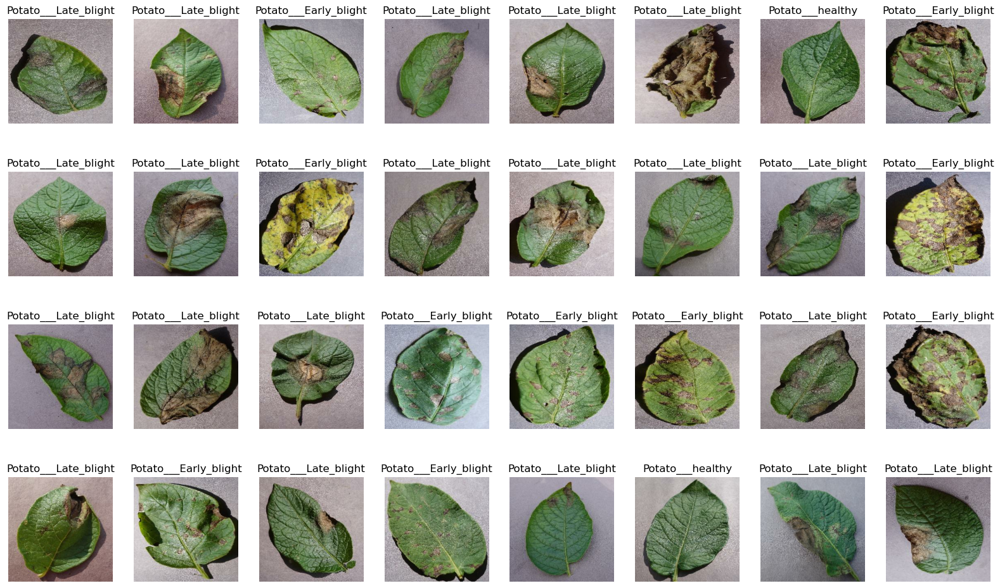

In [7]:
plt.figure(figsize=(20, 12))
for image_batch, label_batch in sample_batch:
    size = len(image_batch)
    columns = 8
    rows = size//columns
    for i in range(size):
        ax = plt.subplot(rows, columns, i + 1)   # rows, cols, idx
        plt.title(class_names[label_batch[i]])
        plt.imshow(image_batch[i].numpy().astype("uint8"))   # converting float to int
        plt.axis("off")

# Split Dataset into Categories: train, validation, test
`train_ds` and `val_ds` is used during training.

`test_ds` is used to test the trained model

In [8]:
def split_dataset(ds, ratios=(8, 1, 1,)):
    total = sum(ratios)
    ds_size = len(ds)
    skip = 0
    for ratio in ratios[:-1]:
        size = int(ds_size * ratio/total)
        yield ds.skip(skip).take(size)
        skip += size
    yield ds.skip(skip)

train_ds, val_ds, test_ds = split_dataset(dataset, (240, 16, 1))

# ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

print("Total:", len(dataset))
print("Train:", len(train_ds))
print("Valid:", len(val_ds))
print("Test :", len(test_ds))

Total: 68
Train: 63
Valid: 4
Test : 1


# Model Creation

In [9]:
for image_batch, label_batch in sample_batch:
    input_shape = image_batch.shape

model = models.Sequential([
    # preprocessing
    layers.experimental.preprocessing.Resizing(256, 256),   # resize images
    layers.experimental.preprocessing.Rescaling(1./255),    # normalize

    # data augmentation
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical", seed=None),
    layers.experimental.preprocessing.RandomRotation(0.5, seed=None),
    layers.experimental.preprocessing.RandomContrast(0.3, seed=None),
    layers.experimental.preprocessing.RandomZoom(0.3, seed=None),

    # layering
    layers.Conv2D(32, kernel_size=(3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    # flatten
    layers.Flatten(),

    # dense layer
    layers.Dense(64, activation='relu'),
    layers.Dense(len(class_names), activation='softmax'),
])


### Model Summary

In [10]:
model.build(input_shape=input_shape)
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resizing (Resizing)          (32, 256, 256, 3)         0         
_________________________________________________________________
rescaling (Rescaling)        (32, 256, 256, 3)         0         
_________________________________________________________________
random_flip (RandomFlip)     (32, 256, 256, 3)         0         
_________________________________________________________________
random_rotation (RandomRotat (32, 256, 256, 3)         0         
_________________________________________________________________
random_contrast (RandomContr (32, 256, 256, 3)         0         
_________________________________________________________________
random_zoom (RandomZoom)     (32, 256, 256, 3)         0         
_________________________________________________________________
conv2d (Conv2D)              (32, 254, 254, 32)        8

### Model Compilation

In [11]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

# Training

In [12]:
keras_callbacks = [
    callbacks.EarlyStopping(monitor='val_loss', patience=30, mode='min', min_delta=0.0001),
    #   callbacks.ModelCheckpoint(checkpoint_path, monitor='val_loss', save_best_only=True, mode='min'),
]

`epochs` : Number of epochs to train the model.

Higher `epochs` increases accuracy.

In [13]:
history = model.fit(
    train_ds,
    validation_data  = val_ds,
    validation_split = 0.0,     # validation_data gets priority
    batch_size       = None,    # defaults to 32
    verbose          = 1,  # 0=silent, 1=progress bar, 2=one line per epoch
    epochs           = 10,
    callbacks        = keras_callbacks
)

Epoch 1/10
63/63 [==============================] - 134s 2s/step - loss: 0.9135 - accuracy: 0.4841 - val_loss: 0.8673 - val_accuracy: 0.4766
Epoch 2/10
63/63 [==============================] - 134s 2s/step - loss: 0.7828 - accuracy: 0.6558 - val_loss: 0.7456 - val_accuracy: 0.6094
Epoch 3/10
63/63 [==============================] - 148s 2s/step - loss: 0.5168 - accuracy: 0.7847 - val_loss: 0.2955 - val_accuracy: 0.8750
Epoch 4/10
63/63 [==============================] - 153s 2s/step - loss: 0.4375 - accuracy: 0.8105 - val_loss: 0.3930 - val_accuracy: 0.8516
Epoch 5/10
63/63 [==============================] - 163s 3s/step - loss: 0.3477 - accuracy: 0.8517 - val_loss: 0.2963 - val_accuracy: 0.8750
Epoch 6/10
63/63 [==============================] - 163s 3s/step - loss: 0.3127 - accuracy: 0.8795 - val_loss: 0.5172 - val_accuracy: 0.8281
Epoch 7/10
63/63 [==============================] - 157s 2s/step - loss: 0.4402 - accuracy: 0.8155 - val_loss: 0.2654 - val_accuracy: 0.8984
Epoch 8/10
63

### Accuracy and Loss Graph

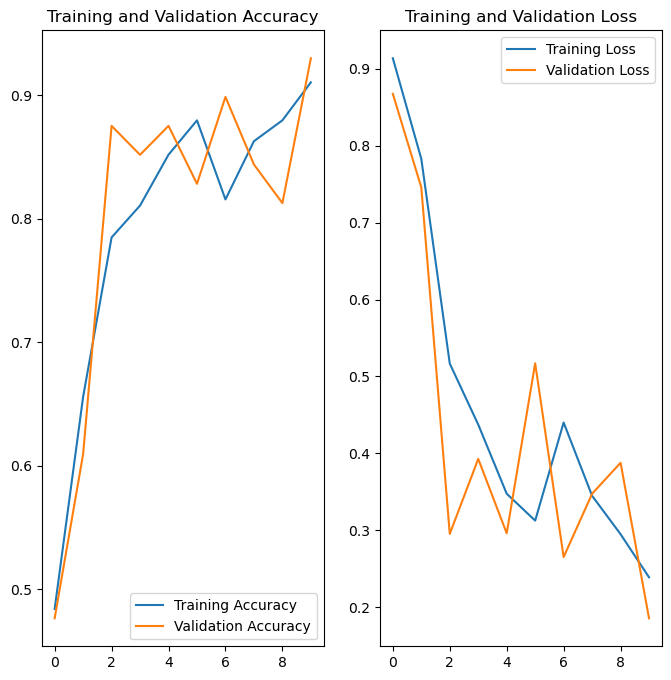

In [14]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

count = len(acc)    # no. of epochs

plt.figure(figsize=(8, 8))

plt.subplot(1, 2, 1)
plt.plot(range(count), acc, label='Training Accuracy')
plt.plot(range(count), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(count), loss, label='Training Loss')
plt.plot(range(count), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

# Testing

### Performance on Test Dataset

In [24]:
scores = model.evaluate(test_ds)    # tuple (loss, accuracy)

1/1 [==============================] - 0s 0s/step - loss: 0.4602 - accuracy: 0.7500


Accuracy: 0.9375
precision: 0.9431818181818181
Recall: 0.9375


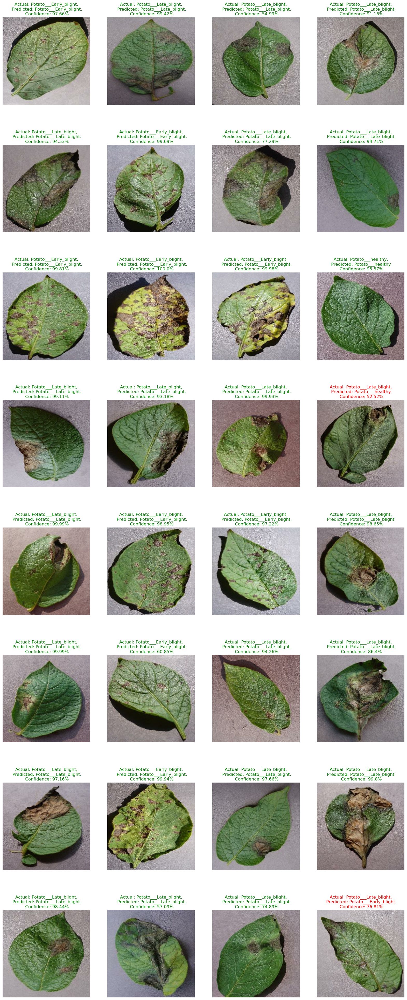

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, recall_score,precision_score

plt.figure(figsize=(20, 50))
predicted_classes = []
actual_classes = []

for image_batch, label_batch in dataset.take(1):
    prediction_batch = model.predict(image_batch)   # contains array of size len(class_names) with confidence
    size = len(image_batch)  # Calculate size dynamically
    for i in range(size):
        image = image_batch[i].numpy().astype("uint8")   # converting float to int
        
        actual_class    = class_names[label_batch[i]]
        predicted_class = class_names[np.argmax(prediction_batch[i])]
        confidence      = round(100 * (np.max(prediction_batch[i])), 2)
        
        ax = plt.subplot(size//4, 4, i + 1)   # row, col, idx
        plt.imshow(image)   
        title = plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.setp(title, color= 'g' if actual_class == predicted_class else 'r')
        plt.axis("off")                            
        # Append predicted and actual classes
        predicted_classes.append(predicted_class)
        actual_classes.append(actual_class)

# Compute accuracy score
accuracy = accuracy_score(predicted_classes, actual_classes)
print("Accuracy:", accuracy)


# compute precision
precision = precision_score(predicted_classes, actual_classes, average='weighted') # specify average parameter
print("precision:",precision)

# Compute recall score
recall = recall_score(predicted_classes, actual_classes, average='weighted') # specify average parameter
print("Recall:", recall)

# Save Model

In [26]:
import os, json, h5py
from datetime import datetime

MODEL_PATH = "models"
MODEL_NAME_FMT = "%Y%m%d_%H%M%S"

if not os.path.exists(MODEL_PATH):
    os.mkdir(MODEL_PATH)

model_version = datetime.now().strftime(MODEL_NAME_FMT)
model_path = f"{MODEL_PATH}/{model_version}.h5"
model.save(model_path)

# writing class_names
with h5py.File(model_path,'r+') as fp:
  fp.attrs['class_names'] = json.dumps(class_names)

# Load Model

### Get the Latest Model

In [27]:
import os

MODEL_PATH = "models"

def listmodels():
    for f in os.listdir(MODEL_PATH):
        # skip hidden files
        if f.startswith('.'):
            continue

        name, ext = f.rsplit('.', 1)

        # skip other files
        if ext != 'h5':
            continue
        
        # skip ill-formatted files
        try:
            int(name)
            yield name
        except:
            pass
        
try:
  model_version = max( listmodels(), key= int )
except:
    raise Exception("No Models Found!")

model_version

'20240404_190235'

### Load Model and Class Names

In [28]:
import json, h5py

model_path = f"{MODEL_PATH}/{model_version}.h5"
model = tf.keras.models.load_model(model_path)

with h5py.File(model_path,'r') as fp:
    class_names = json.loads(fp.attrs.get('class_names'))

class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

# Test a Single Image

In [29]:
from keras.preprocessing.image import load_img, img_to_array
image_path = "img/Potato___Early_blight/001187a0-57ab-4329-baff-e7246a9edeb0___RS_Early.B 8178.JPG"
image = load_img(image_path)
input_arr = img_to_array(image)
input_arr = np.array([input_arr])  # Convert single image to a batch.
predictions = model.predict(input_arr)

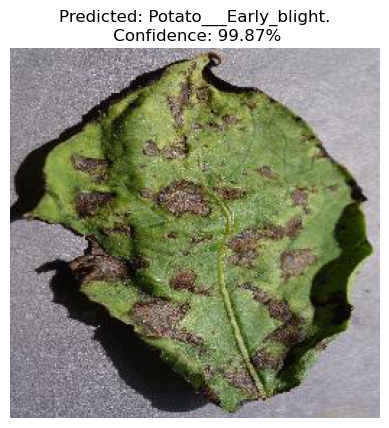

In [30]:
predicted_class = class_names[np.argmax(predictions)]
confidence      = round(100 * (np.max(predictions)), 2)

plt.title(f"Predicted: {predicted_class}.\n Confidence: {confidence}%")
plt.imshow(image)
plt.axis("off")
plt.show()

#### TESTING A RANDOM IMAGE NOT IN DATASET

In [31]:
from keras.preprocessing.image import load_img, img_to_array
image_path =r'C:\Users\Anshul\Downloads\ca2020__potato_damage1.png'
image = load_img(image_path)
input_arr = img_to_array(image)
input_arr = np.array([input_arr])  # Convert single image to a batch.
predictions = model.predict(input_arr)

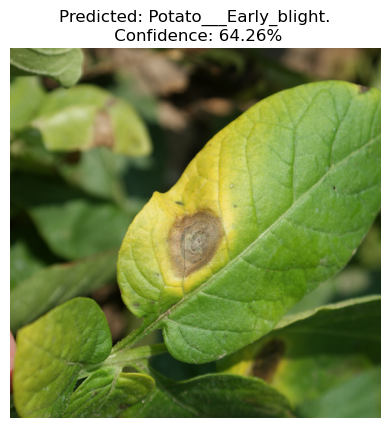

In [32]:
predicted_class = class_names[np.argmax(predictions)]
confidence      = round(100 * (np.max(predictions)), 2)

plt.title(f"Predicted: {predicted_class}.\n Confidence: {confidence}%")
plt.imshow(image)
plt.axis("off")
plt.show()